### LOADING LIBRARIES

In [1]:
# import required libraries for dataframe and visualization

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px


# import required libraries for clustering
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os


### LOADING THE DATA

In [2]:
data = pd.read_excel('./Online Retail.xlsx')
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [4]:
data.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,541909.000000,541909,541909.000000,406829.000000
mean,9.552250,2011-07-04 13:34:57.156386048,4.611114,15287.690570
min,-80995.000000,2010-12-01 08:26:00,-11062.060000,12346.000000
25%,1.000000,2011-03-28 11:34:00,1.250000,13953.000000
50%,3.000000,2011-07-19 17:17:00,2.080000,15152.000000
75%,10.000000,2011-10-19 11:27:00,4.130000,16791.000000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000
std,218.081158,NaN,96.759853,1713.600303


### DATA CLEANING

* LOOKING AT THE CUSTOMER ID FIELD, WE CAN SEE IT CONTAINS MISSING NUMBERS. 
* BUT LET'S SEE IF IT HOLDS SIGNIFICANT INFORMATION
* IF IT CONTAINS ALL UNIQUE VALUES OR THERE ARE SOME REPITTIONS

In [5]:
data['CustomerID'].unique()

array([17850., 13047., 12583., ..., 13298., 14569., 12713.])

In [6]:
data['CustomerID'].nunique()

4372

* WE CAN SEE THAT THE FIELD HOLDS SIGNIFICANT INFORMATION.
* SUCH THAT THERE ARE 4372 UNIQUE CUSTOMERIDs, SO, WE CAN DROP THE WHOLE COLUMN.
* LET'S JUST DROP THE NANs

In [7]:
data.dropna(inplace=True, axis=0)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 27.9+ MB


In [9]:
data.shape

(406829, 8)

### EXLPLORATORY DATA ANALYSIS

In [10]:
import seaborn as sns

In [11]:
data['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada',
       'Unspecified', 'Brazil', 'USA', 'European Community', 'Bahrain',
       'Malta', 'RSA'], dtype=object)

In [11]:
data['Country'].value_counts()

Country
United Kingdom          361878
Germany                   9495
France                    8491
EIRE                      7485
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               1877
Portugal                  1480
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
USA                        291
Israel                     250
Unspecified                244
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon                     45


In [12]:
data['Country'].nunique()

37

<Axes: >

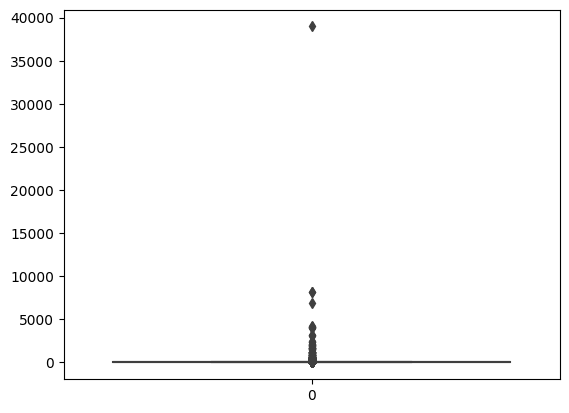

In [13]:
sns.boxplot(data['UnitPrice'])

<Axes: xlabel='Country', ylabel='count'>

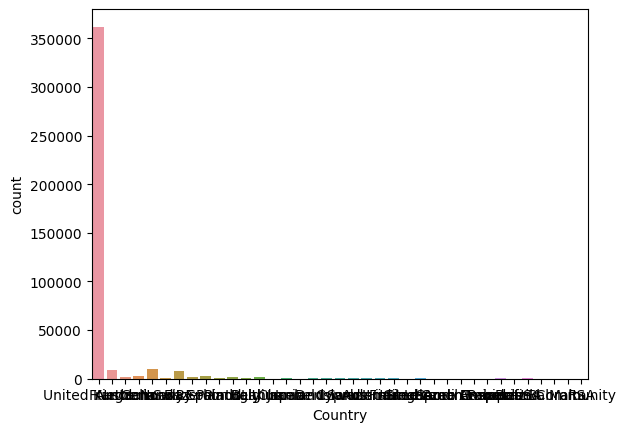

In [14]:
sns.countplot(data, x=data['Country'])

In [15]:
data['Description'][:5]

0     WHITE HANGING HEART T-LIGHT HOLDER
1                    WHITE METAL LANTERN
2         CREAM CUPID HEARTS COAT HANGER
3    KNITTED UNION FLAG HOT WATER BOTTLE
4         RED WOOLLY HOTTIE WHITE HEART.
Name: Description, dtype: object

### feature enginering

In [12]:
data['AmountSpent'] = data['Quantity']*data['UnitPrice']

In [13]:
data.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID,AmountSpent
count,406829.000000,406829,406829.000000,406829.000000,406829.000000
mean,12.061303,2011-07-10 16:30:57.879207424,3.460471,15287.690570,20.401854
min,-80995.000000,2010-12-01 08:26:00,0.000000,12346.000000,-168469.600000
25%,2.000000,2011-04-06 15:02:00,1.250000,13953.000000,4.200000
50%,5.000000,2011-07-31 11:48:00,1.950000,15152.000000,11.100000
75%,12.000000,2011-10-20 13:06:00,3.750000,16791.000000,19.500000
max,80995.000000,2011-12-09 12:50:00,38970.000000,18287.000000,168469.600000
std,248.693370,NaN,69.315162,1713.600303,427.591718


In [14]:
data['Quantity'].min()

-80995

It's impossible for quantity to be less than zero. So, we drop those less than zero

In [15]:
data = data.reset_index()

In [16]:
data[data['Quantity']>0].shape

(397924, 10)

In [17]:
data[data['Quantity']<0].shape

(8905, 10)

In [18]:
data = data[data['Quantity']>0]

In [19]:
data.describe()

,index,Quantity,InvoiceDate,UnitPrice,CustomerID,AmountSpent
count,397924.000000,397924.000000,397924,397924.000000,397924.000000,397924.000000
mean,278465.221859,13.021823,2011-07-10 23:43:36.912475648,3.116174,15294.315171,22.394749
min,0.000000,1.000000,2010-12-01 08:26:00,0.000000,12346.000000,0.000000
25%,148333.750000,2.000000,2011-04-07 11:12:00,1.250000,13969.000000,4.680000
50%,284907.500000,6.000000,2011-07-31 14:39:00,1.950000,15159.000000,11.800000
75%,410079.250000,12.000000,2011-10-20 14:33:00,3.750000,16795.000000,19.800000
max,541908.000000,80995.000000,2011-12-09 12:50:00,8142.750000,18287.000000,168469.600000
std,152771.368303,180.420210,NaN,22.096788,1713.169877,309.055588


In [20]:

# Convert to datetime to proper datatype

data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'],format='%d-%m-%Y %H:%M')
data.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent
0,0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34


In [21]:
# Compute the maximum date to know the last transaction date in our dataset

max_date = max(data['InvoiceDate'])
max_date

Timestamp('2011-12-09 12:50:00')

In [22]:
# calculate the time difference between the maximum date in the dataset and the transaction date for each record

data['Diff'] = max_date - data['InvoiceDate']
data.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,Diff
0,0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,373 days 04:24:00
1,1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
2,2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,373 days 04:24:00
3,3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00
4,4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,373 days 04:24:00


In [23]:
data[data['CustomerID']==12346.0]

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,AmountSpent,Diff
38120,61619,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2011-01-18 10:01:00,1.04,12346.0,United Kingdom,77183.6,325 days 02:49:00


In [24]:
grouped_data = data.groupby('CustomerID')

In [25]:
data['CustomerID'] = data['CustomerID'].astype(str)

In [26]:
grouped_data['Country'].describe()

,count,unique,top,freq
CustomerID,,,,
12346.0,1,1,United Kingdom,1
12347.0,182,1,Iceland,182
12348.0,31,1,Finland,31
12349.0,73,1,Italy,73
12350.0,17,1,Norway,17
...,...,...,...,...
18280.0,10,1,United Kingdom,10
18281.0,7,1,United Kingdom,7
18282.0,12,1,United Kingdom,12


In [27]:
grouped_data['Country'].describe()['top']

CustomerID
12346.0    United Kingdom
12347.0           Iceland
12348.0           Finland
12349.0             Italy
12350.0            Norway
                ...      
18280.0    United Kingdom
18281.0    United Kingdom
18282.0    United Kingdom
18283.0    United Kingdom
18287.0    United Kingdom
Name: top, Length: 4339, dtype: object

In [28]:
grouped_data['AmountSpent'].describe()

,count,mean,std,min,25%,50%,75%,max
CustomerID,,,,,,,,
12346.0,1.0,77183.600000,NaN,77183.60,77183.600,77183.60,77183.6000,77183.60
12347.0,182.0,23.681319,23.289902,5.04,13.200,17.00,25.1400,249.60
12348.0,31.0,57.975484,48.514857,13.20,39.600,41.76,60.0000,240.00
12349.0,73.0,24.076027,34.655913,6.64,14.850,17.70,20.2800,300.00
12350.0,17.0,19.670588,7.275538,8.50,15.000,19.80,25.2000,40.00
...,...,...,...,...,...,...,...,...
18280.0,10.0,18.060000,3.380319,14.85,15.075,17.70,19.3875,23.70
18281.0,7.0,11.545714,6.110444,5.04,5.040,15.30,16.7250,16.95
18282.0,12.0,14.837500,5.853579,5.04,12.750,13.71,17.7000,25.50


In [29]:
grouped_data['Diff'].describe()

,count,mean,std,min,25%,50%,75%,max
CustomerID,,,,,,,,
12346.0,1,325 days 02:49:00,NaT,325 days 02:49:00,325 days 02:49:00,325 days 02:49:00,325 days 02:49:00,325 days 02:49:00
12347.0,182,189 days 08:21:15.824175824,129 days 22:27:48.583512074,1 days 20:58:00,39 days 00:25:00,182 days 23:49:00,316 days 22:20:00,366 days 21:53:00
12348.0,31,305 days 00:20:21.290322580,86 days 06:15:06.944722416,74 days 23:37:00,283 days 02:05:30,357 days 17:41:00,357 days 17:41:00,357 days 17:41:00
12349.0,73,18 days 02:59:00,0 days 00:00:00,18 days 02:59:00,18 days 02:59:00,18 days 02:59:00,18 days 02:59:00,18 days 02:59:00
12350.0,17,309 days 20:49:00,0 days 00:00:00,309 days 20:49:00,309 days 20:49:00,309 days 20:49:00,309 days 20:49:00,309 days 20:49:00
...,...,...,...,...,...,...,...,...
18280.0,10,277 days 02:58:00,0 days 00:00:00,277 days 02:58:00,277 days 02:58:00,277 days 02:58:00,277 days 02:58:00,277 days 02:58:00
18281.0,7,180 days 01:57:00,0 days 00:00:00,180 days 01:57:00,180 days 01:57:00,180 days 01:57:00,180 days 01:57:00,180 days 01:57:00
18282.0,12,76 days 10:01:40,61 days 05:40:30.092906027,7 days 01:07:00,7 days 01:07:00,125 days 23:15:00,125 days 23:15:00,125 days 23:15:00


In [30]:
newData = grouped_data['AmountSpent'].sum().reset_index()

In [31]:
newData.head(
    
)

,CustomerID,AmountSpent
0,12346.0,77183.60
1,12347.0,4310.00
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40


In [32]:
newData['Country'] = grouped_data['Country'].describe()['top'].values

In [33]:
newData.head()

,CustomerID,AmountSpent,Country
0,12346.0,77183.60,United Kingdom
1,12347.0,4310.00,Iceland
2,12348.0,1797.24,Finland
3,12349.0,1757.55,Italy
4,12350.0,334.40,Norway


In [34]:
newData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4339 entries, 0 to 4338
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CustomerID   4339 non-null   float64
 1   AmountSpent  4339 non-null   float64
 2   Country      4339 non-null   object 
dtypes: float64(2), object(1)
memory usage: 101.8+ KB


In [35]:
newData['Frequency'] = grouped_data['AmountSpent'].describe()['count'].values

In [36]:
newData.head()

,CustomerID,AmountSpent,Country,Frequency
0,12346.0,77183.60,United Kingdom,1.0
1,12347.0,4310.00,Iceland,182.0
2,12348.0,1797.24,Finland,31.0
3,12349.0,1757.55,Italy,73.0
4,12350.0,334.40,Norway,17.0


In [37]:
newData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4339 entries, 0 to 4338
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CustomerID   4339 non-null   float64
 1   AmountSpent  4339 non-null   float64
 2   Country      4339 non-null   object 
 3   Frequency    4339 non-null   float64
dtypes: float64(3), object(1)
memory usage: 135.7+ KB


In [38]:
newData['Recency'] = grouped_data['Diff'].min().dt.days.reset_index()['Diff']

In [39]:
newData.head()

,CustomerID,AmountSpent,Country,Frequency,Recency
0,12346.0,77183.60,United Kingdom,1.0,325
1,12347.0,4310.00,Iceland,182.0,1
2,12348.0,1797.24,Finland,31.0,74
3,12349.0,1757.55,Italy,73.0,18
4,12350.0,334.40,Norway,17.0,309


In [40]:
newData.info(
    
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4339 entries, 0 to 4338
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CustomerID   4339 non-null   float64
 1   AmountSpent  4339 non-null   float64
 2   Country      4339 non-null   object 
 3   Frequency    4339 non-null   float64
 4   Recency      4339 non-null   int64  
dtypes: float64(3), int64(1), object(1)
memory usage: 169.6+ KB


In [41]:
from sklearn.preprocessing import OrdinalEncoder

In [42]:
encoder = OrdinalEncoder()

encoder.fit_transform(newData[['Country']])

array([[35.],
       [16.],
       [12.],
       ...,
       [35.],
       [35.],
       [35.]])

In [43]:
newData['Country'] = encoder.fit_transform(newData[['Country']])

In [44]:
newData.head()

,CustomerID,AmountSpent,Country,Frequency,Recency
0,12346.0,77183.60,35.0,1.0,325
1,12347.0,4310.00,16.0,182.0,1
2,12348.0,1797.24,12.0,31.0,74
3,12349.0,1757.55,18.0,73.0,18
4,12350.0,334.40,24.0,17.0,309


### REMOVING OUTLIERS

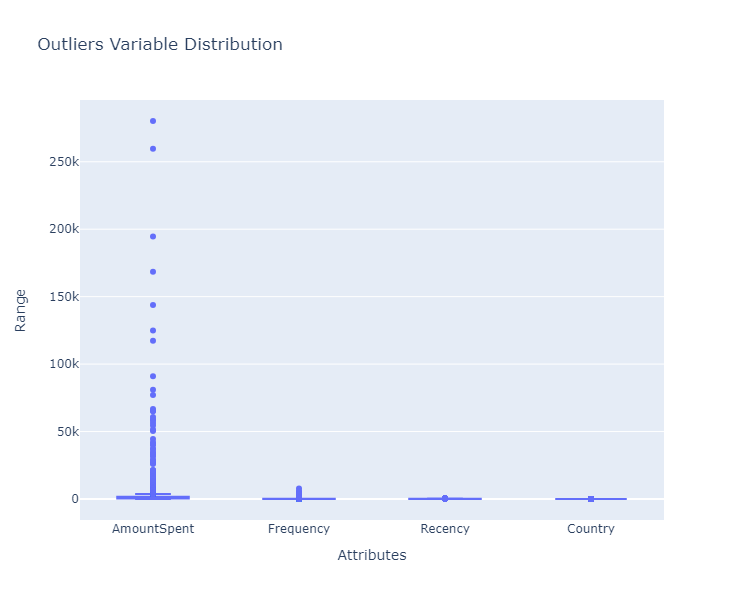

In [45]:

# Create a DataFrame containing the selected attributes
attributes = ['AmountSpent', 'Frequency', 'Recency', 'Country']
data = newData[attributes]

# Create a box plot with Plotly
fig = px.box(data, y=attributes, labels={'variable': 'Attributes', 'value': 'Range'},
             title="Outliers Variable Distribution")
fig.update_layout(
    xaxis=dict(title="Attributes"),
    yaxis=dict(title="Range"),
    showlegend=False,
    boxmode='group',  # Display box plots side by side
    width=800, height=600
)
fig.show()


In [46]:

# Removing (statistical) outliers for Amount
Q1 = newData.AmountSpent.quantile(0.05)
Q3 = newData.AmountSpent.quantile(0.95)
IQR = Q3 - Q1
newData = newData[(newData.AmountSpent >= Q1 - 1.5*IQR) & (newData.AmountSpent <= Q3 + 1.5*IQR)]



# Removing (statistical) outliers for Recency
Q1 = newData.Recency.quantile(0.05)
Q3 = newData.Recency.quantile(0.95)
IQR = Q3 - Q1
newData = newData[(newData.Recency >= Q1 - 1.5*IQR) & (newData.Recency <= Q3 + 1.5*IQR)]

# Removing (statistical) outliers for Frequency
Q1 = newData.Frequency.quantile(0.05)
Q3 = newData.Frequency.quantile(0.95)
IQR = Q3 - Q1
newData = newData[(newData.Frequency >= Q1 - 1.5*IQR) & (newData.Frequency <= Q3 + 1.5*IQR)]

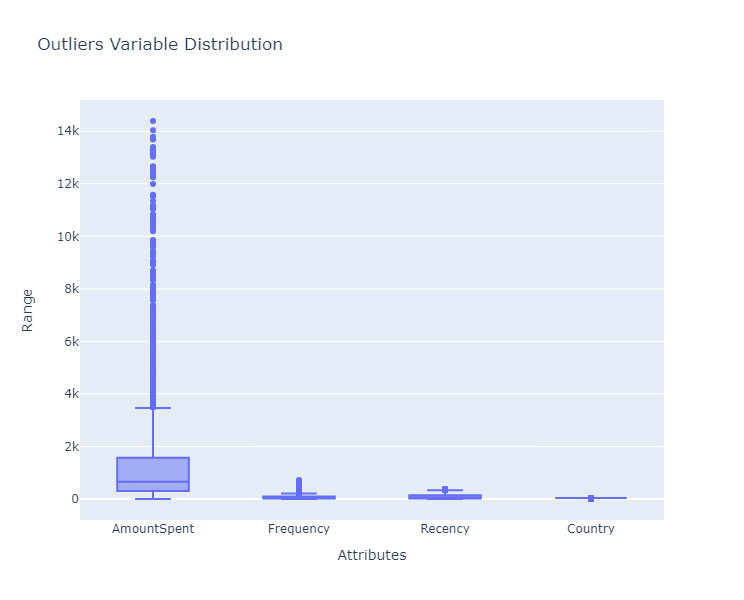

In [47]:
fig = px.box(newData, y=attributes, title="Outliers Variable Distribution", 
             labels={'variable': 'Attributes', 'value': 'Range'},
             boxmode='group', points='outliers')

fig.update_layout(
    xaxis=dict(title="Attributes", title_font=dict(size=14)),
    yaxis=dict(title="Range", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


In [48]:
import joblib
joblib.dump(encoder, './encoder.joblib')

['./encoder.joblib']

In [49]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

newData[attributes] = scaler.fit_transform(newData[attributes].values)

In [50]:
newData.head()

,CustomerID,AmountSpent,Country,Frequency,Recency
1,12347.0,1.645726,-2.796867,1.067832,-0.917872
2,12348.0,0.262124,-3.447030,-0.460601,-0.189272
3,12349.0,0.240269,-2.471786,-0.035474,-0.748198
4,12350.0,-0.543361,-1.496542,-0.602310,2.156221
5,12352.0,0.652411,-1.496542,0.085991,-0.578524


In [51]:
joblib.dump(scaler, './scaler.joblib')

['./scaler.joblib']

In [52]:
newData.to_csv('./CleanedData.csv', index=False)

In [53]:
nd = pd.read_csv('./CleanedData.csv')

In [54]:
nd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4257 entries, 0 to 4256
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   CustomerID   4257 non-null   float64
 1   AmountSpent  4257 non-null   float64
 2   Country      4257 non-null   float64
 3   Frequency    4257 non-null   float64
 4   Recency      4257 non-null   float64
dtypes: float64(5)
memory usage: 166.4 KB


### Building Model

#### KMEANS

In [55]:
finalData = newData.drop('CustomerID', axis = 1)

In [56]:
finalData.head()

,AmountSpent,Country,Frequency,Recency
1,1.645726,-2.796867,1.067832,-0.917872
2,0.262124,-3.447030,-0.460601,-0.189272
3,0.240269,-2.471786,-0.035474,-0.748198
4,-0.543361,-1.496542,-0.602310,2.156221
5,0.652411,-1.496542,0.085991,-0.578524


##### ELBOW METHOD OF FINDING CLUSTER

In [79]:

ssd = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(finalData)
    
    ssd.append(kmeans.inertia_)
    print("For n_clusters={0}, the Elbow score is {1}".format(num_clusters, kmeans.inertia_))

fig = px.line(x=range_n_clusters, y=ssd, 
              title="Elbow Curve for K-Means Clustering",
              labels={'x': 'Number of Clusters', 'y': 'Sum of Squared Distances (SSD)'})

fig.update_layout(
    xaxis=dict(title_font=dict(size=14)),
    yaxis=dict(title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


For n_clusters=2, the Elbow score is 11875.883329365488
For n_clusters=3, the Elbow score is 8340.3891630974
For n_clusters=4, the Elbow score is 5369.842989652525
For n_clusters=5, the Elbow score is 4344.451738096341
For n_clusters=6, the Elbow score is 3745.229314260898
For n_clusters=7, the Elbow score is 3371.463021462897
For n_clusters=8, the Elbow score is 3047.4620284747075


In [80]:
ssd

[11875.883329365488,
 8340.3891630974,
 5369.842989652525,
 4344.451738096341,
 3745.229314260898,
 3371.463021462897,
 3047.4620284747075]

##### SILHOUETTE ANALYSIS

In [81]:
# Silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(finalData)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(finalData, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))
    

For n_clusters=2, the silhouette score is 0.48934118627999296
For n_clusters=3, the silhouette score is 0.541457086567341
For n_clusters=4, the silhouette score is 0.49382611894174333
For n_clusters=5, the silhouette score is 0.47269512560738247
For n_clusters=6, the silhouette score is 0.45761635860398275
For n_clusters=7, the silhouette score is 0.4062070725628059
For n_clusters=8, the silhouette score is 0.4031098400092844


In [82]:
# Final model with k=3
kmeans = KMeans(n_clusters=4, max_iter=50)
kmeans.fit(finalData)

KMeans(max_iter=50, n_clusters=4)

In [83]:
 kmeans.labels_

array([3, 3, 3, ..., 1, 0, 0], dtype=int32)

In [84]:
# assign the label
finalData['Cluster_Id'] = kmeans.labels_
finalData.head()

,AmountSpent,Country,Frequency,Recency,Cluster_Id
1,1.645726,-2.796867,1.067832,-0.917872,3
2,0.262124,-3.447030,-0.460601,-0.189272,3
3,0.240269,-2.471786,-0.035474,-0.748198,3
4,-0.543361,-1.496542,-0.602310,2.156221,1
5,0.652411,-1.496542,0.085991,-0.578524,0


In [85]:
# assign the label
newData['Cluster_Id'] = kmeans.labels_
newData.head()

,CustomerID,AmountSpent,Country,Frequency,Recency,Cluster_Id
1,12347.0,1.645726,-2.796867,1.067832,-0.917872,3
2,12348.0,0.262124,-3.447030,-0.460601,-0.189272,3
3,12349.0,0.240269,-2.471786,-0.035474,-0.748198,3
4,12350.0,-0.543361,-1.496542,-0.602310,2.156221,1
5,12352.0,0.652411,-1.496542,0.085991,-0.578524,0


In [87]:

fig = px.box(finalData, x='Cluster_Id', y='AmountSpent',
             title="Cluster Id vs Amount Box Plot",
             labels={'Cluster_Id': 'Cluster ID', 'Amount': 'Amount'},
             color='Cluster_Id')

fig.update_layout(
    xaxis=dict(title="Cluster ID", title_font=dict(size=14)),
    yaxis=dict(title="Amount", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


In [89]:

fig = px.scatter(finalData, x='Cluster_Id', y='AmountSpent', color='Frequency',
                 title='Cluster ID vs AmountSpent (Color Encoded by Frequency)',
                 labels={'Cluster_Id': 'Cluster ID', 'Amount': 'Amount', 'Frequency': 'Frequency'})

fig.update_layout(
    xaxis=dict(title="Cluster ID", title_font=dict(size=14)),
    yaxis=dict(title="Amount", title_font=dict(size=14)),
    showlegend=True,
    width=800,
    height=600
)

fig.show()


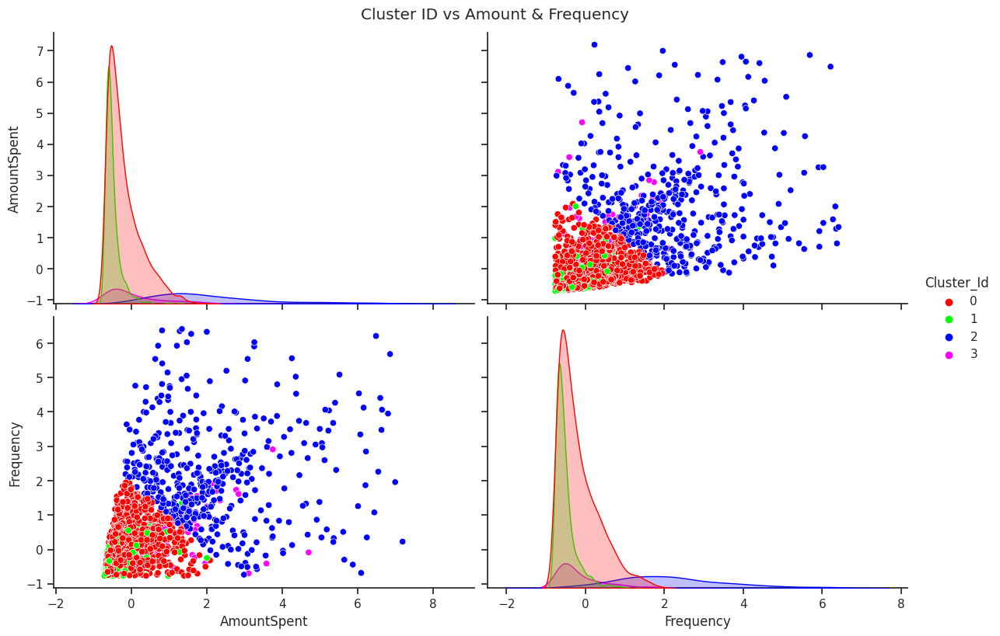

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a custom color palette with Red, Green, and Blue, Purple
custom_palette = sns.color_palette(["#FF0000", "#00FF00", "#0000FF", "#FF00FF"])

# Create a scatter plot matrix with separate plots for each cluster, custom palette, and a larger size
sns.set(style="ticks")
sns.pairplot(finalData, hue='Cluster_Id', vars=['AmountSpent', 'Frequency'], palette=custom_palette, height=4, aspect=1.5)
plt.suptitle('Cluster ID vs Amount & Frequency', y=1.02)
plt.show()


In [97]:

fig = px.box(finalData, x='Cluster_Id', y='Frequency',
             title="Cluster Id vs Frequency Box Plot",
             labels={'Cluster_Id': 'Cluster ID', 'Frequency': 'Frequency'})

fig.update_layout(
    xaxis=dict(title="Cluster ID", title_font=dict(size=14)),
    yaxis=dict(title="Frequency", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


In [98]:

fig = px.box(finalData, x='Cluster_Id', y='Recency',
             title="Cluster Id vs Recency Box Plot",
             labels={'Cluster_Id': 'Cluster ID', 'Recency': 'Recency'})

fig.update_layout(
    xaxis=dict(title="Cluster ID", title_font=dict(size=14)),
    yaxis=dict(title="Recency", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


#### FEATURE SELECTION

##### BASED ON EXPLORATIONS

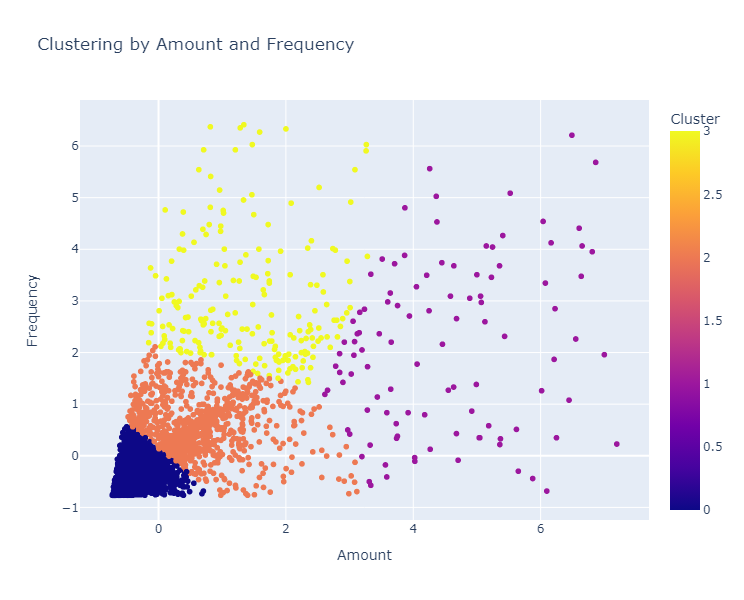

In [81]:
# Selecting the two features for clustering
data_for_clustering = finalData[['AmountSpent', 'Frequency']]

# Specify the number of clusters (e.g., 3)
n_clusters = 4

# Apply K-Means clustering
kmeans = KMeans(n_clusters=n_clusters)
finalData['Cluster_2D'] = kmeans.fit_predict(data_for_clustering)

# Create a scatter plot with Plotly
fig = px.scatter(finalData, x='AmountSpent', y='Frequency', color='Cluster_2D',
                 title='Clustering by Amount and Frequency',
                 labels={'Amount': 'Amount', 'Frequency': 'Frequency', 'Cluster_2D': 'Cluster'})

fig.update_layout(
    xaxis=dict(title="Amount", title_font=dict(size=14)),
    yaxis=dict(title="Frequency", title_font=dict(size=14)),
    width=800,
    height=600
)

fig.show()


In [82]:
silhouette_score(data_for_clustering, kmeans.predict(data_for_clustering))

0.594545282866038

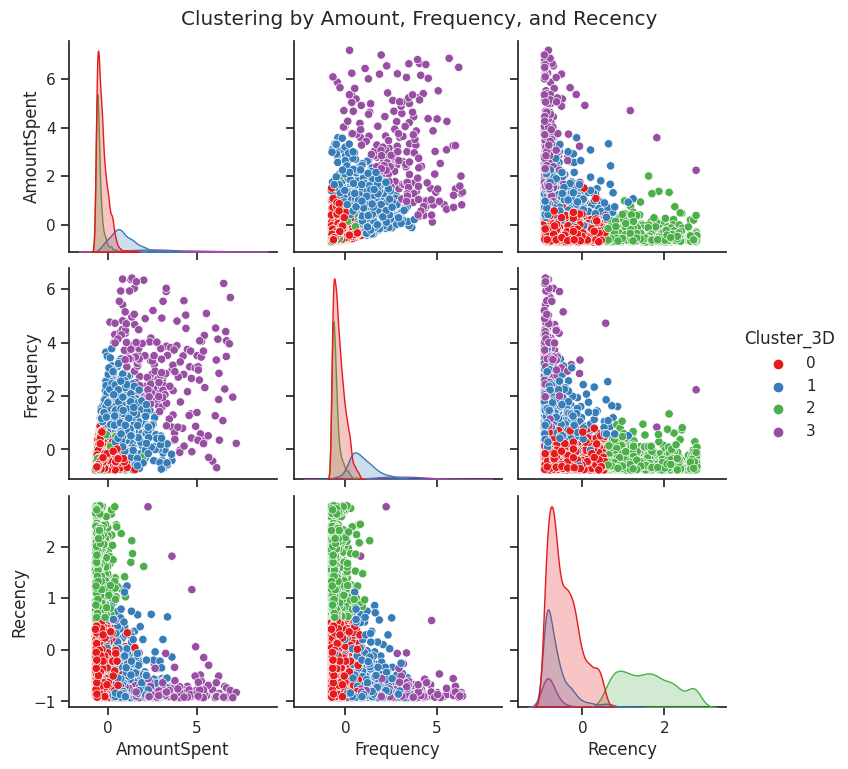

In [58]:
# Selecting three features for clustering
data_for_clustering = finalData[['AmountSpent', 'Frequency', 'Recency']]

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4)
finalData['Cluster_3D'] = kmeans.fit_predict(data_for_clustering)

# Visualize the clusters (scatter plot matrix)
sns.set(style="ticks")
sns.pairplot(finalData, hue='Cluster_3D', vars=['AmountSpent', 'Frequency', 'Recency'], palette='Set1')
plt.suptitle('Clustering by Amount, Frequency, and Recency', y=1.02)
plt.show()


In [59]:
joblib.dump(kmeans, './kmeans2.joblib')

['./kmeans2.joblib']

In [80]:
silhouette_score(data_for_clustering, kmeans.predict(data_for_clustering))

0.4851654323063987

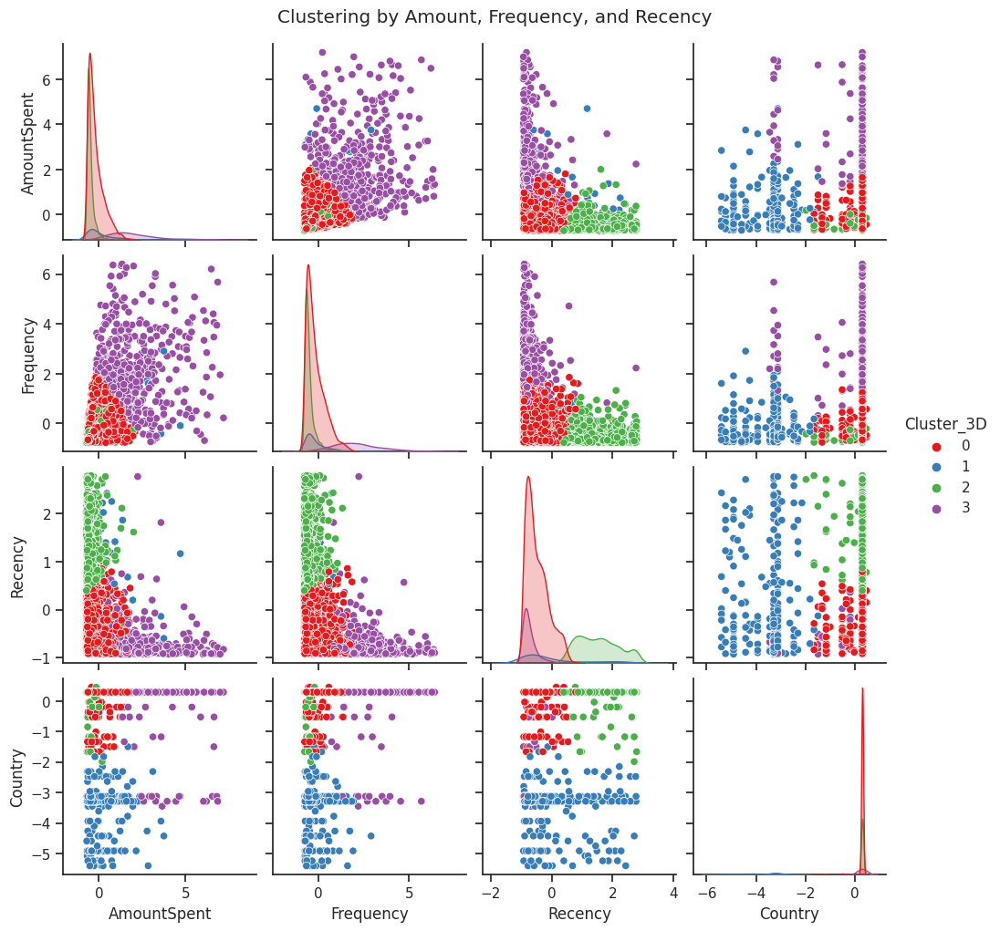

In [77]:
# Selecting the four features for clustering
data_for_clustering = finalData[['AmountSpent', 'Frequency', 'Recency', 'Country']]

# Apply K-Means clustering
kmeans = KMeans(n_clusters=n_clusters)
finalData['Cluster_3D'] = kmeans.fit_predict(data_for_clustering)

# Visualize the clusters (scatter plot matrix)
sns.set(style="ticks")
sns.pairplot(finalData, hue='Cluster_3D', vars=['AmountSpent', 'Frequency', 'Recency', 'Country'], palette='Set1')
plt.suptitle('Clustering by Amount, Frequency, and Recency', y=1.02)
plt.show()


WE CAN SEE THAT THE COUNTRY COLUMN DOES NOT REALLY IMPOROVE THE CLUSTERS

In [140]:
import plotly.express as px

# Apply K-Means clustering
kmeans = KMeans(n_clusters=n_clusters)
finalData['Cluster_3D'] = kmeans.fit_predict(data_for_clustering)

# Create a 3D scatter plot matrix with Plotly
fig = px.scatter_3d(finalData, x='AmountSpent', y='Frequency', z='Recency', color='Cluster_3D',
                     labels={'Amount': 'AmountSpent', 'Frequency': 'Frequency', 'Recency': 'Recency', 'Cluster_3D': 'Cluster'})

fig.update_layout(
    scene=dict(
        xaxis_title='Amount',
        yaxis_title='Frequency',
        zaxis_title='Recency',
    ),
    title='Clustering by Amount, Frequency, and Recency',
    width=1000,
    height=800
)

fig.show()


##### BASED ON PCA

In [58]:
from sklearn.decomposition import PCA

In [59]:
pca = PCA(n_components=0.90)

In [60]:
pcaData = pca.fit_transform(finalData[['AmountSpent','Frequency','Recency','Country']])

In [61]:
pcaData

array([[ 2.31224593,  2.63615543, -0.43940605],
       [ 0.19728573,  3.36976023, -0.87761365],
       [ 0.63905157,  2.28414114, -1.05000146],
       ...,
       [-1.28610495, -0.13640459,  0.35771636],
       [-0.43368381, -0.4765419 , -1.10539188],
       [ 0.34795563, -0.355677  , -0.31065113]])

In [62]:
pca.components_

array([[ 0.62506589,  0.6298974 , -0.45583205, -0.06884069],
       [ 0.0903695 , -0.05272134,  0.19824565, -0.97455245],
       [ 0.33622967,  0.31458434,  0.86699821,  0.19052666]])

In [63]:
pca.explained_variance_ratio_

array([0.47828484, 0.25289882, 0.1870206 ])

In [64]:
pca.explained_variance_ratio_.sum()-1

-0.08179573696402664

In [65]:
joblib.dump(pca, './pca.joblib')

['./pca.joblib']

In [67]:
kmeans = KMeans(n_clusters=4)
pcaPreds = kmeans.fit_predict(pcaData)

In [68]:
predsPcaData = np.c_[pcaData,pcaPreds]

In [69]:
pcaPredsDf = pd.DataFrame(predsPcaData, columns= ['AmountSpent', 'Frequency', 'Recency','Cluster_Labels'])

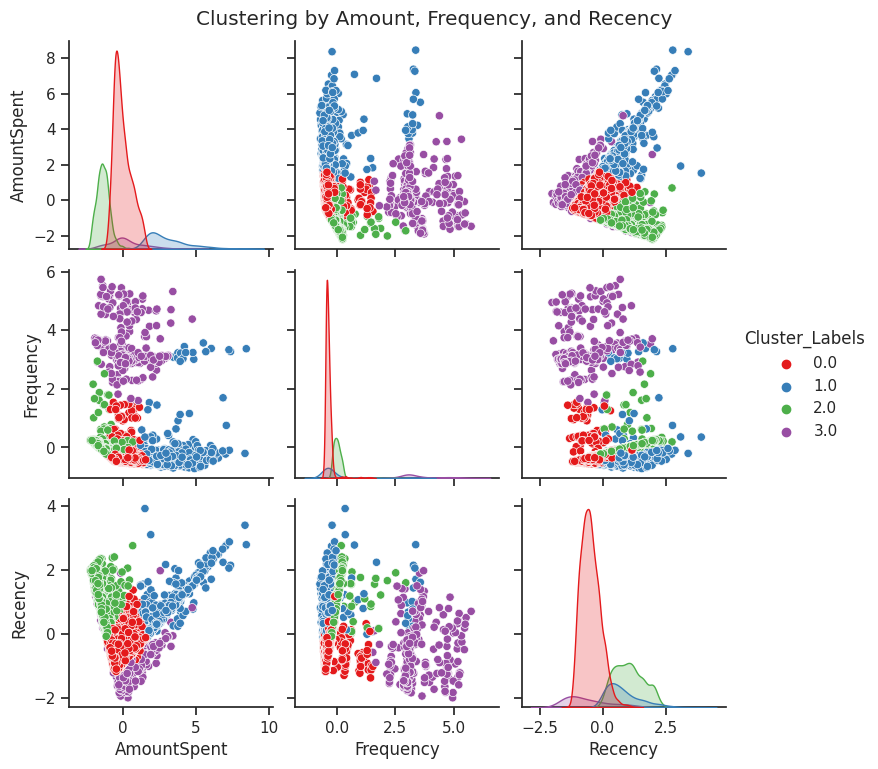

In [70]:
sns.set(style="ticks")
sns.pairplot(pcaPredsDf, hue='Cluster_Labels', vars=['AmountSpent', 'Frequency', 'Recency'], palette='Set1')
plt.suptitle('Clustering by Amount, Frequency, and Recency', y=1.02)
plt.show()

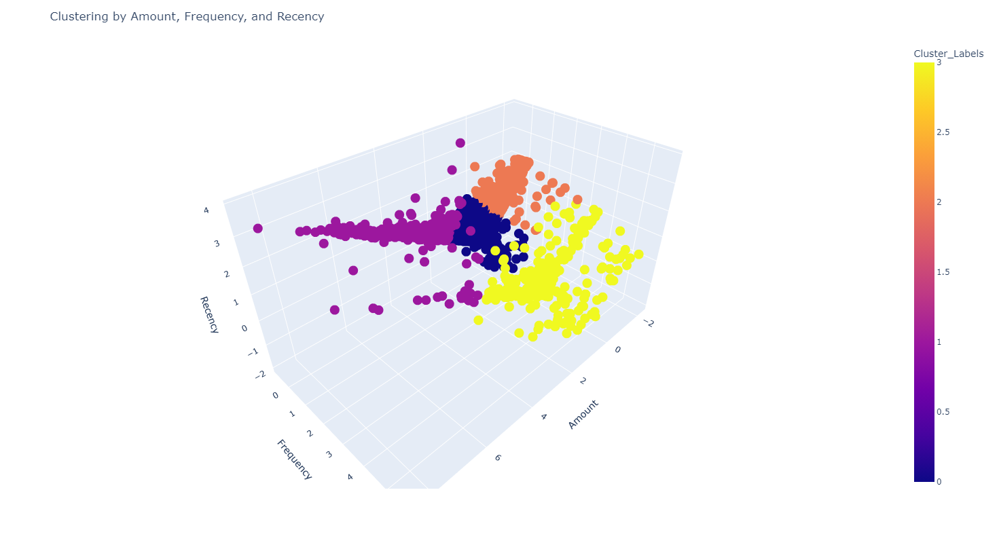

In [71]:
fig = px.scatter_3d(pcaPredsDf, x='AmountSpent', y='Frequency', z='Recency', color='Cluster_Labels',
                     labels={'AmountSpent': 'AmountSpent', 'Frequency': 'Frequency', 'Recency': 'Recency', 'Cluster_3D': 'Cluster'})

fig.update_layout(
    scene=dict(
        xaxis_title='Amount',
        yaxis_title='Frequency',
        zaxis_title='Recency',
    ),
    title='Clustering by Amount, Frequency, and Recency',
    width=1000,
    height=800
)

fig.show()

In [72]:
pcaPreds

array([3, 3, 3, ..., 2, 0, 0], dtype=int32)

In [74]:
joblib.dump(kmeans,'./kmeans.joblib')

['./kmeans.joblib']

In [78]:
silhouette_score(pcaData, pcaPreds)

0.5346647506787744

#### HEIRARCHICAL CLUSTERING

##### ORIGINAL DATA

In [95]:
# Selecting three features for clustering
data_for_clustering = finalData[['AmountSpent', 'Frequency', 'Recency']]

In [110]:
data_for_clustering.shape

(4257, 3)

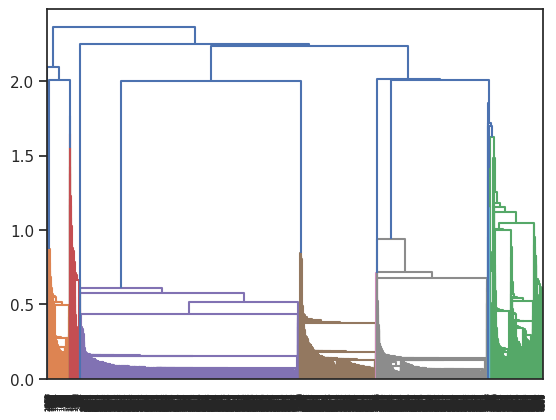

In [141]:
mergings = linkage(finalData, method="single", metric='euclidean')
dendrogram(mergings)
plt.show()

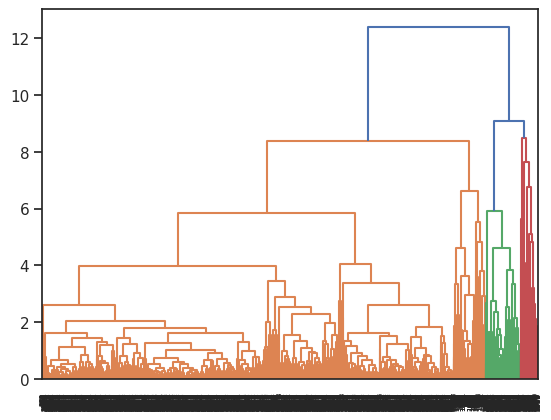

In [142]:
mergings = linkage(finalData, method="complete", metric='euclidean')
dendrogram(mergings)
plt.show()

In [60]:
mergings = linkage(data_for_clustering, method="average", metric='euclidean')
dendrogram(mergings)
plt.show()


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x7f54d69bcf40> (for post_execute):



KeyboardInterrupt



Error in callback <function flush_figures at 0x7f54ca5da2a0> (for post_execute):


KeyboardInterrupt: 

In [61]:
mergings = linkage(data_for_clustering, method="average", metric='euclidean')

joblib.dump(mergings, './mergings2.joblib')

['./mergings2.joblib']

In [97]:
# 4 clusters
cluster_labels = cut_tree(mergings, n_clusters=4).reshape(-1, )
cluster_labels

array([0, 0, 0, ..., 0, 0, 0])

In [98]:
silhouette_score(data_for_clustering, cluster_labels)

0.5124377132487254

In [99]:
finalData['Cluster_Labels'] = cluster_labels
finalData.head()

,AmountSpent,Country,Frequency,Recency,Cluster_2D,Cluster_3D,Cluster_Labels
1,1.645726,-2.796867,1.067832,-0.917872,2,3,0
2,0.262124,-3.447030,-0.460601,-0.189272,0,0,0
3,0.240269,-2.471786,-0.035474,-0.748198,2,0,0
4,-0.543361,-1.496542,-0.602310,2.156221,0,1,0
5,0.652411,-1.496542,0.085991,-0.578524,2,3,0


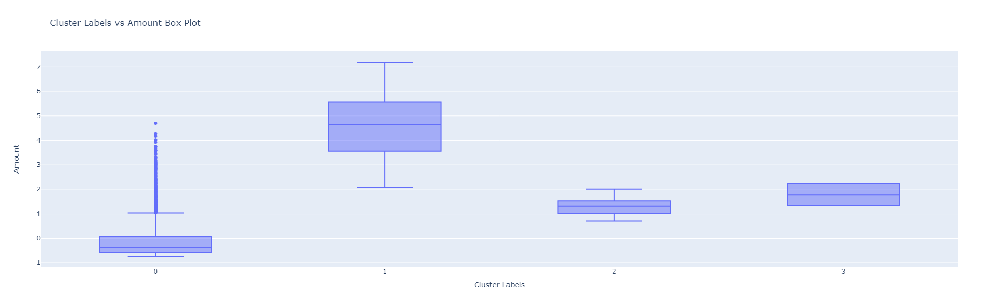

In [100]:

fig = px.box(finalData, x='Cluster_Labels', y='AmountSpent',
             title="Cluster Labels vs Amount Box Plot",
             labels={'Cluster_Labels': 'Cluster Labels', 'Amount': 'Amount'})

fig.update_layout(
    xaxis=dict(title="Cluster Labels", title_font=dict(size=14)),
    yaxis=dict(title="Amount", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


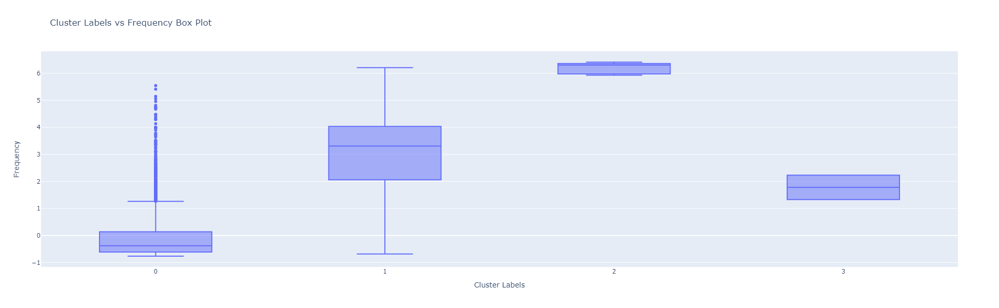

In [101]:

fig = px.box(finalData, x='Cluster_Labels', y='Frequency',
             title="Cluster Labels vs Frequency Box Plot",
             labels={'Cluster_Labels': 'Cluster Labels', 'Frequency': 'Frequency'})

fig.update_layout(
    xaxis=dict(title="Cluster Labels", title_font=dict(size=14)),
    yaxis=dict(title="Frequency", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


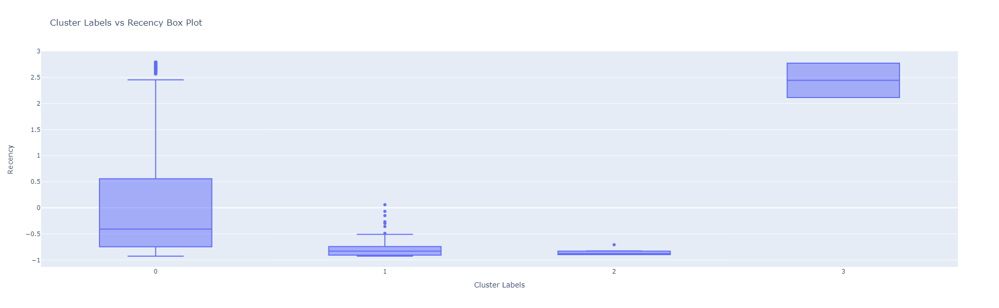

In [102]:

fig = px.box(finalData, x='Cluster_Labels', y='Recency',
             title="Cluster Labels vs Recency Box Plot",
             labels={'Cluster_Labels': 'Cluster Labels', 'Recency': 'Recency'})

fig.update_layout(
    xaxis=dict(title="Cluster Labels", title_font=dict(size=14)),
    yaxis=dict(title="Recency", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


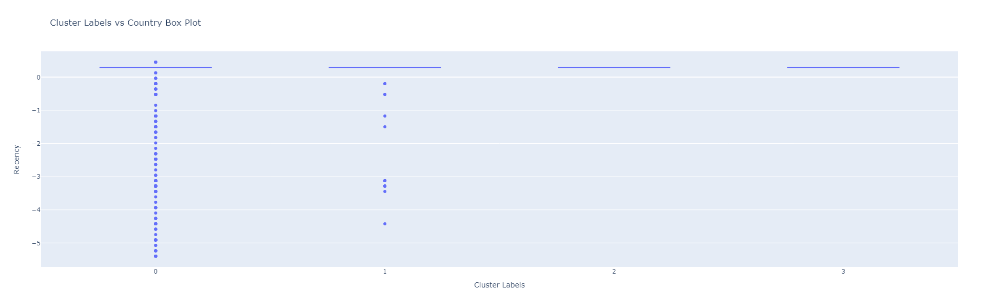

In [103]:

fig = px.box(finalData, x='Cluster_Labels', y='Country',
             title="Cluster Labels vs Country Box Plot",
             labels={'Cluster_Labels': 'Cluster Labels', 'Recency': 'Recency'})

fig.update_layout(
    xaxis=dict(title="Cluster Labels", title_font=dict(size=14)),
    yaxis=dict(title="Recency", title_font=dict(size=14)),
    showlegend=False,
    width=800,
    height=600
)

fig.show()


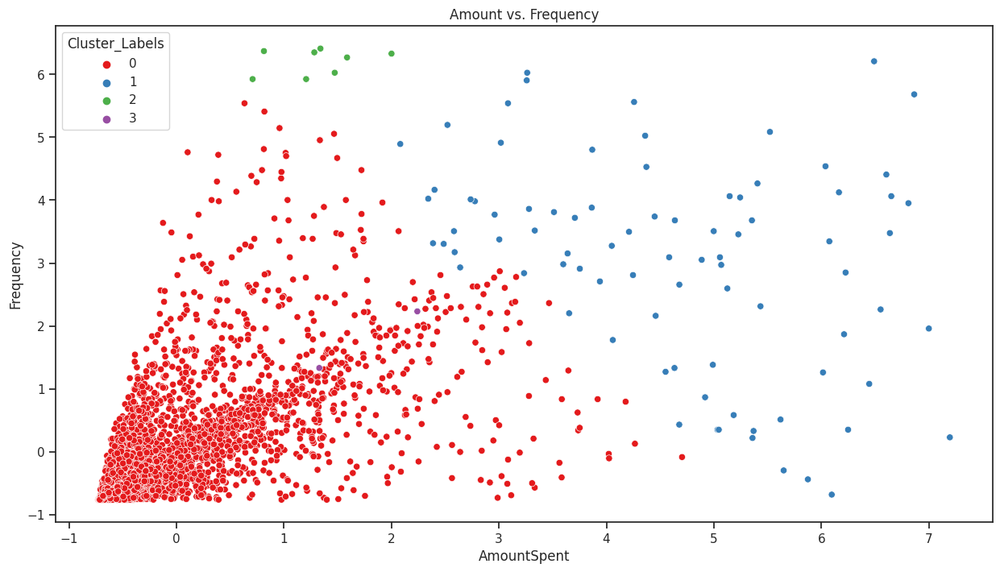

In [104]:
# Pairwise scatter plots for clustering (2D)
plt.figure(figsize=(15, 8))  # Adjust the figure size here

# Amount vs. Frequency
sns.scatterplot(x='AmountSpent', y='Frequency', hue='Cluster_Labels', data=finalData, palette='Set1')
plt.title('Amount vs. Frequency');


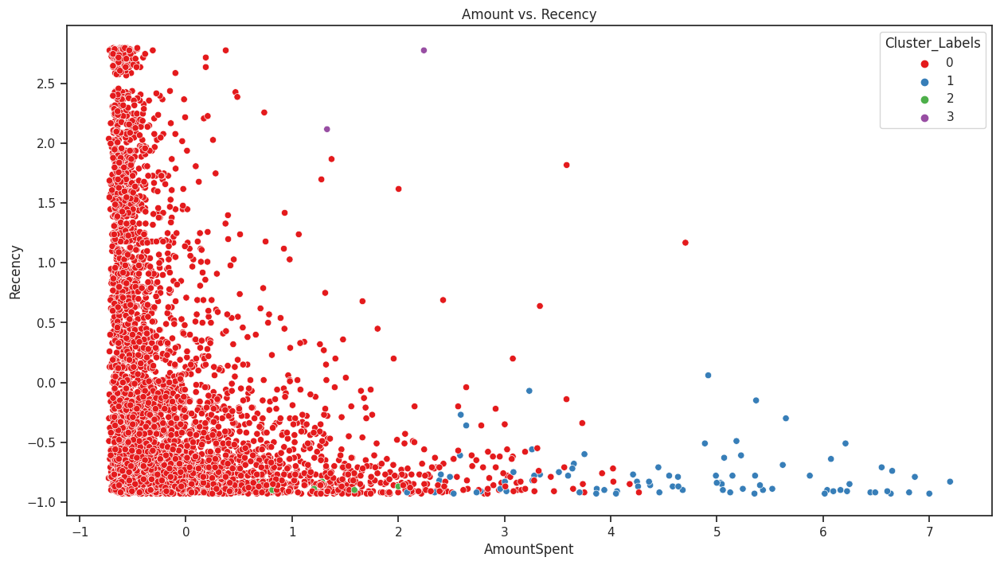

In [105]:
# Pairwise scatter plots for clustering (2D)
plt.figure(figsize=(15, 8))  # Adjust the figure size here

# Amount vs. Frequency
sns.scatterplot(x='AmountSpent', y='Recency', hue='Cluster_Labels', data=finalData, palette='Set1')
plt.title('Amount vs. Recency');


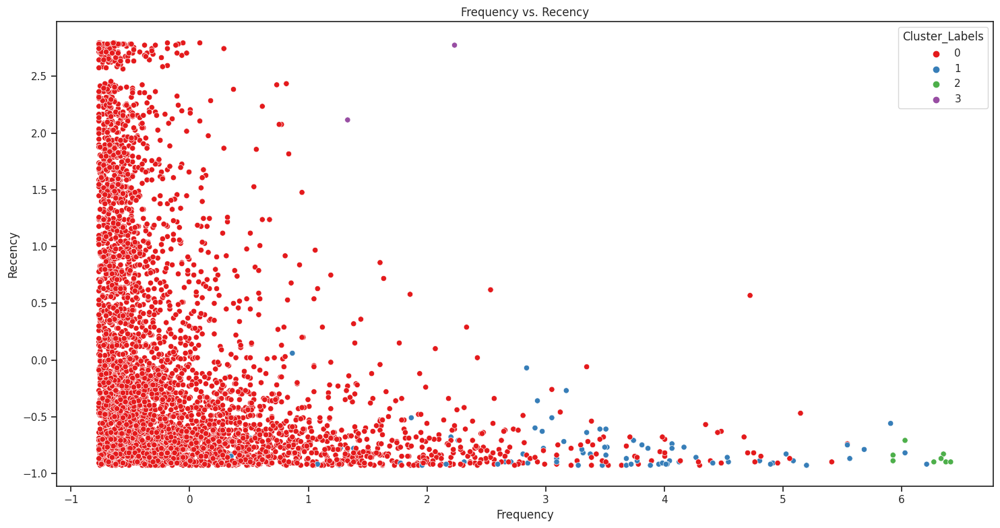

In [106]:
# Frequency vs. Recency
plt.figure(figsize=(15, 8))  # Adjust the figure size here
sns.scatterplot(x='Frequency', y='Recency', hue='Cluster_Labels', data=finalData, palette='Set1')
plt.title('Frequency vs. Recency')

plt.tight_layout()
plt.show()

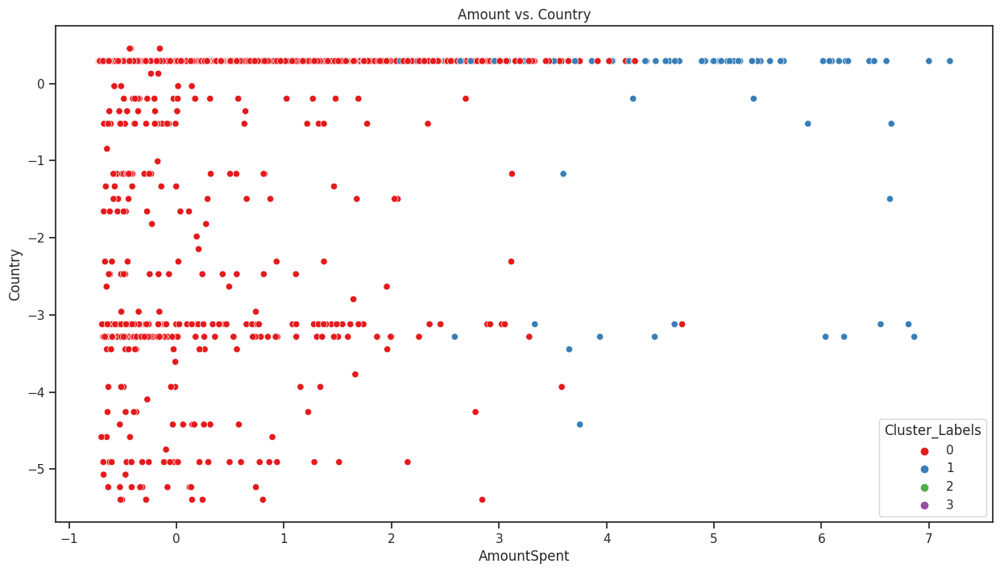

In [107]:
# Pairwise scatter plots for clustering (2D)
plt.figure(figsize=(15, 8))  # Adjust the figure size here

# Amount vs. Frequency
sns.scatterplot(x='AmountSpent', y='Country', hue='Cluster_Labels', data=finalData, palette='Set1')
plt.title('Amount vs. Country');


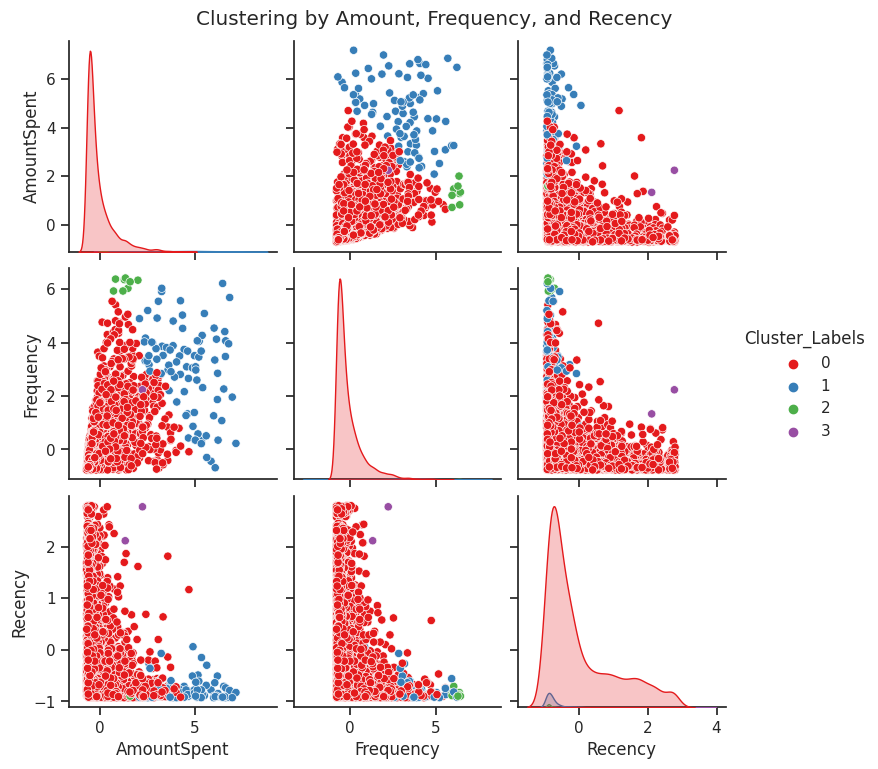

In [108]:
sns.set(style="ticks")
sns.pairplot(finalData, hue='Cluster_Labels', vars=['AmountSpent', 'Frequency', 'Recency'], palette='Set1')
plt.suptitle('Clustering by Amount, Frequency, and Recency', y=1.02)
plt.show()

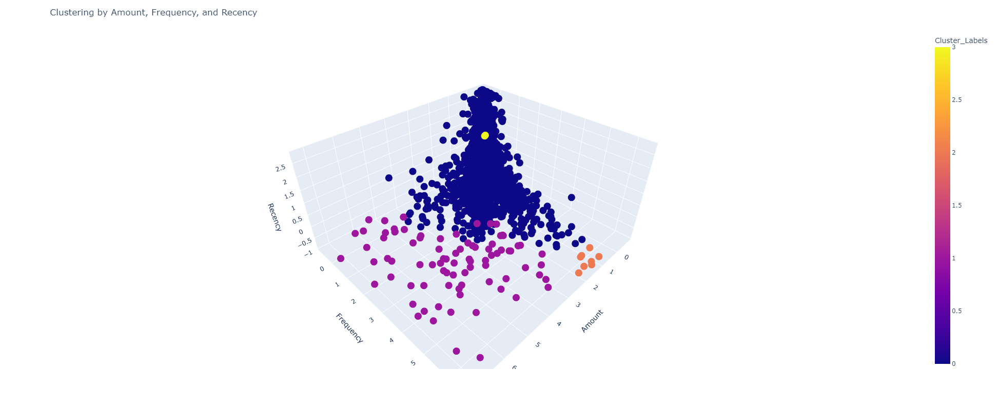

In [109]:
fig = px.scatter_3d(finalData, x='AmountSpent', y='Frequency', z='Recency', color='Cluster_Labels',
                     labels={'AmountSpent': 'AmountSpent', 'Frequency': 'Frequency', 'Recency': 'Recency', 'Cluster_3D': 'Cluster'})

fig.update_layout(
    scene=dict(
        xaxis_title='Amount',
        yaxis_title='Frequency',
        zaxis_title='Recency',
    ),
    title='Clustering by Amount, Frequency, and Recency',
    width=1000,
    height=800
)

fig.show()

##### PCA DATA

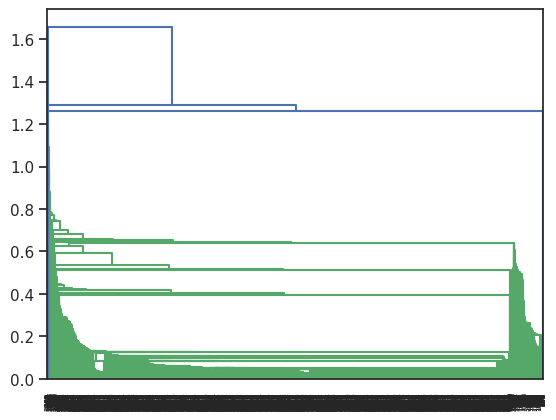

In [156]:
mergings = linkage(pcaData, method="single", metric='euclidean')
dendrogram(mergings)
plt.show()

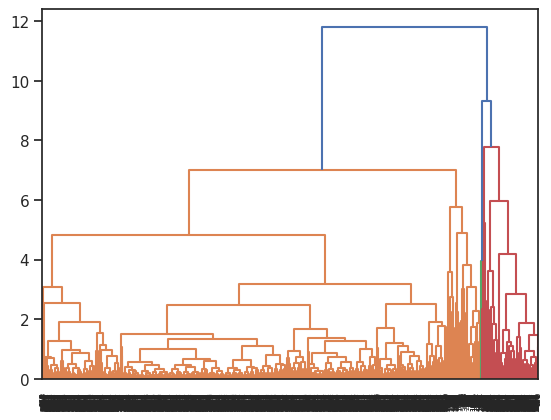

In [157]:
mergings = linkage(pcaData, method="complete", metric='euclidean')
dendrogram(mergings)
plt.show()

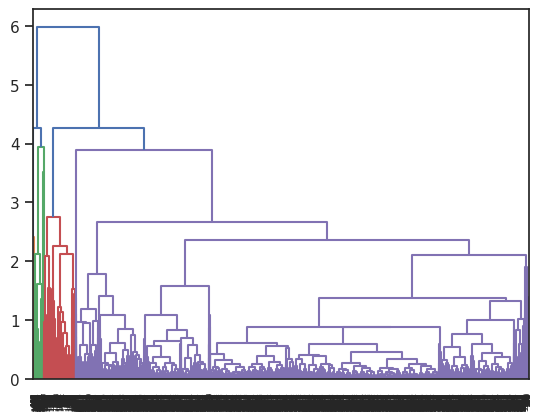

In [86]:
mergings = linkage(pcaData, method="average", metric='euclidean')
dendrogram(mergings)
plt.show()

In [111]:
mergings = linkage(pcaData, method="average", metric='euclidean')
joblib.dump(mergings,'./mergings.joblib')

['./mergings.joblib']

In [113]:
# 4 clusters

mergings = joblib.load('./mergings.joblib')
cluster_labels = cut_tree(mergings, n_clusters=4).reshape(-1, )
cluster_labels

array([0, 0, 0, ..., 1, 1, 1])

In [114]:
silhouette_score(pcaData, cluster_labels)

0.5723328354845109

In [89]:
pcaPredsDf['Cluster_Labels'] = cluster_labels

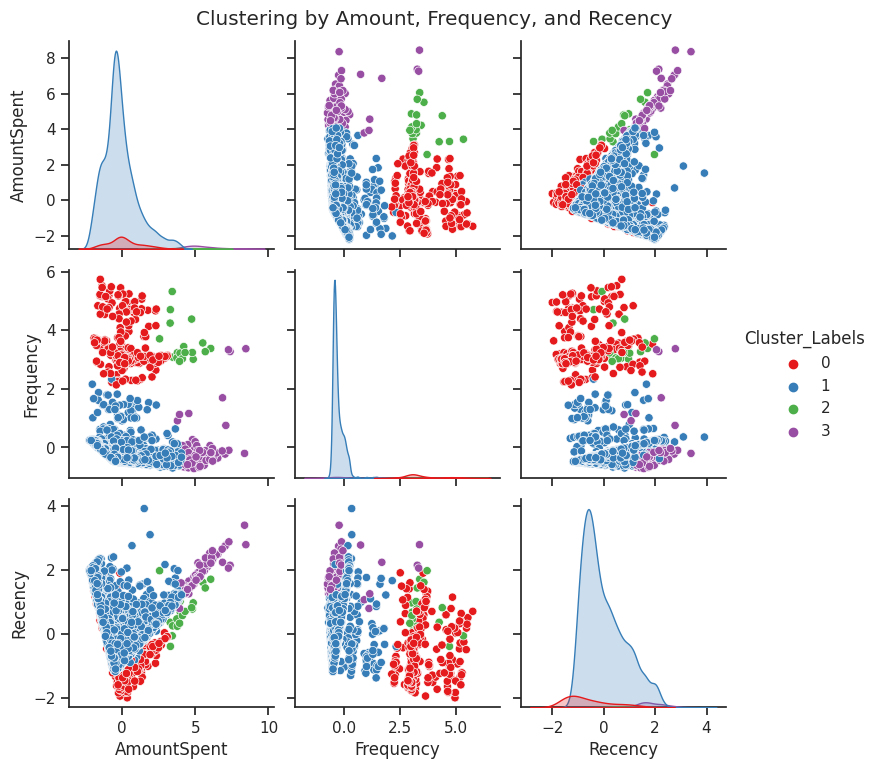

In [161]:
sns.set(style="ticks")
sns.pairplot(pcaPredsDf, hue='Cluster_Labels', vars=['AmountSpent', 'Frequency', 'Recency'], palette='Set1')
plt.suptitle('Clustering by Amount, Frequency, and Recency', y=1.02)
plt.show()

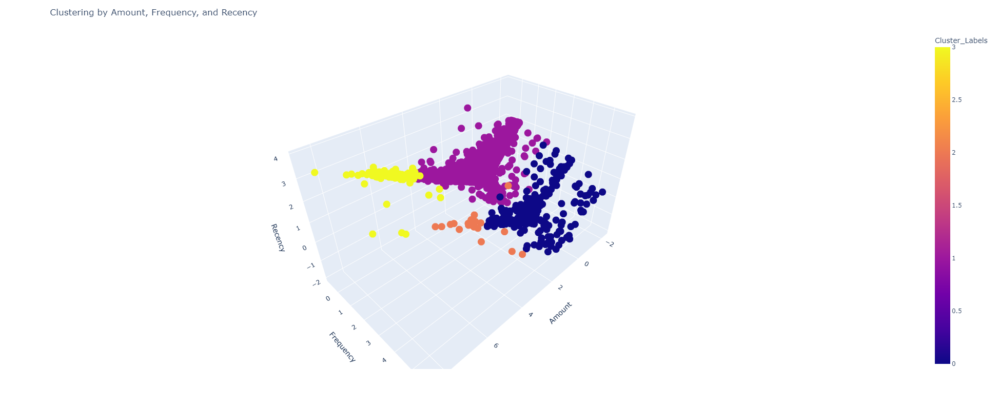

In [90]:
fig = px.scatter_3d(pcaPredsDf, x='AmountSpent', y='Frequency', z='Recency', color='Cluster_Labels',
                     labels={'AmountSpent': 'AmountSpent', 'Frequency': 'Frequency', 'Recency': 'Recency', 'Cluster_3D': 'Cluster'})

fig.update_layout(
    scene=dict(
        xaxis_title='Amount',
        yaxis_title='Frequency',
        zaxis_title='Recency',
    ),
    title='Clustering by Amount, Frequency, and Recency',
    width=1000,
    height=800
)

fig.show()

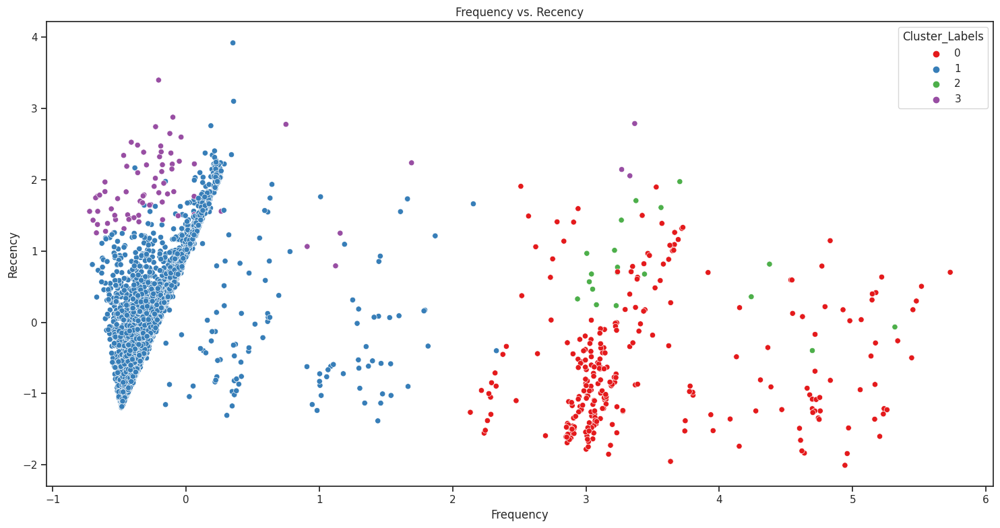

In [91]:
# Frequency vs. Recency
plt.figure(figsize=(15, 8))  # Adjust the figure size here
sns.scatterplot(x='Frequency', y='Recency', hue='Cluster_Labels', data=pcaPredsDf, palette='Set1')
plt.title('Frequency vs. Recency')

plt.tight_layout()
plt.show()

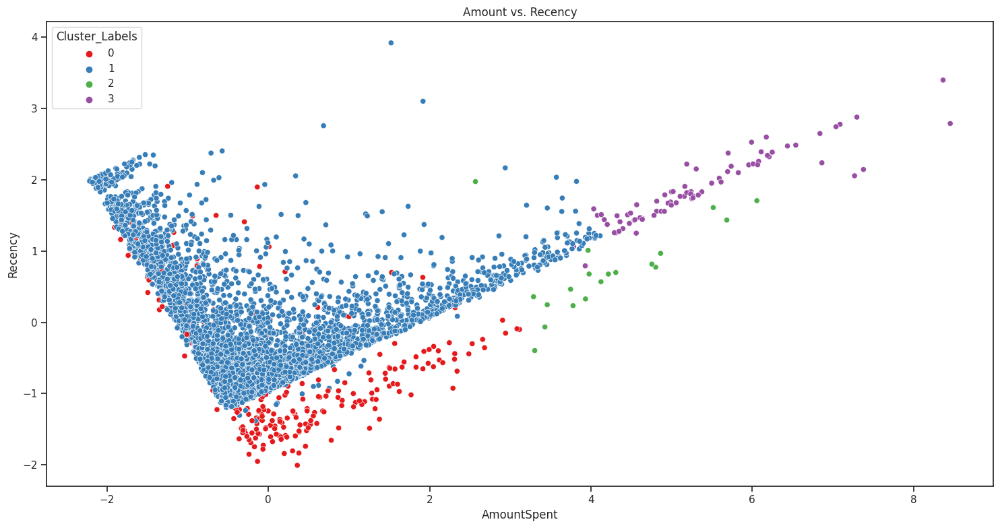

In [115]:
# Frequency vs. Recency
plt.figure(figsize=(15, 8))  # Adjust the figure size here
sns.scatterplot(x='AmountSpent', y='Recency', hue='Cluster_Labels', data=pcaPredsDf, palette='Set1')
plt.title('Amount vs. Recency')

plt.tight_layout()
plt.show()

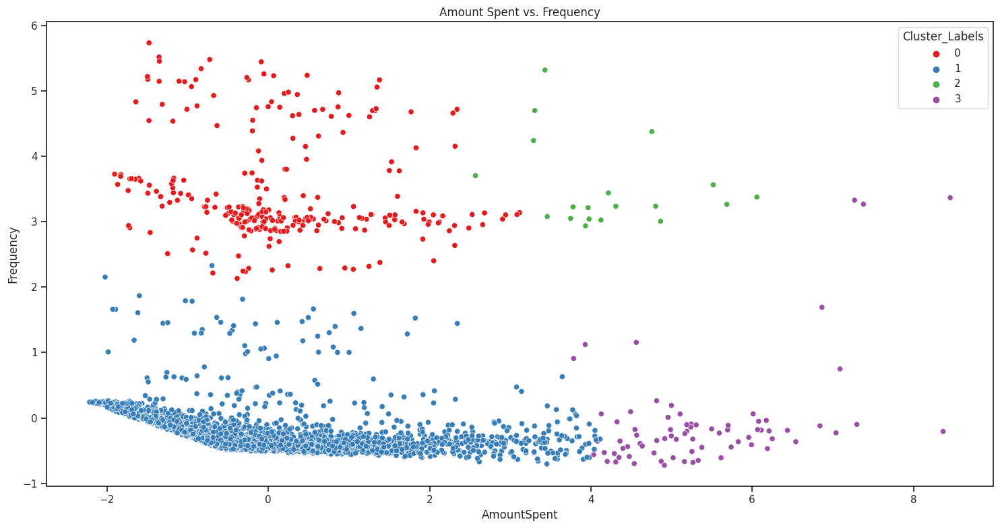

In [116]:
# Frequency vs. Recency
plt.figure(figsize=(15, 8))  # Adjust the figure size here
sns.scatterplot(x='AmountSpent', y='Frequency', hue='Cluster_Labels', data=pcaPredsDf, palette='Set1')
plt.title('Amount Spent vs. Frequency')

plt.tight_layout()
plt.show()